In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from dataset import *
from save_load import *
from NN_library.PINN import *
from NN_library.train_primal_VPINN import *
from NN_library.train_dual_VPINN import *
from matplotlib.tri import Triangulation
from utility import *
%load_ext autoreload
%autoreload 2

Using device: cuda


In [2]:
data = dataset_grid(129, [0, 2*np.pi], [0, 2*np.pi])
loaders = get_loaders_Sobol(data, 129**2)

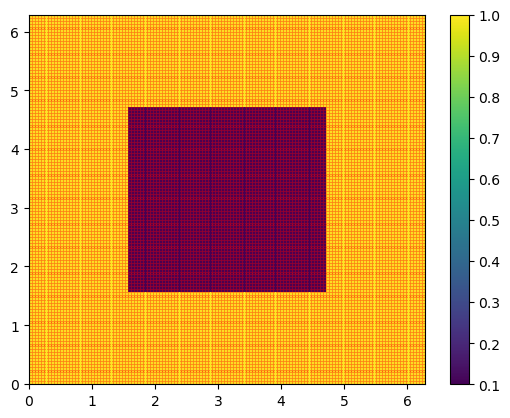

In [3]:
L = 2*np.pi
N = 512 # number of nodes in each direction including the border
x = np.linspace(0, L, N, endpoint=True)
y = np.linspace(0, L, N, endpoint=True)

XY = np.meshgrid(x, y)
grid_data = torch.tensor(np.vstack((XY[0].flatten(), XY[1].flatten())).T, dtype=torch.float, device=dev)
eps=100
def a_function(x,y):
    a = np.where((x>np.pi/2)&(x<3*np.pi/2)&(y>np.pi/2)&(y<3*np.pi/2), 0.1, 1)
    return a

def A(x):
    a = torch.where((x[:,0]>torch.pi/2)&(x[:,0]<3*torch.pi/2)&(x[:,1]>torch.pi/2)&(x[:,1]<3*torch.pi/2), 0.1, 1).view(-1,1,1)
    I = torch.eye(2, device=dev).repeat(x.shape[0], 1, 1)
    A = a * I
    return A

def A_inv(x):  
    a = torch.where((x[:,0]>torch.pi/2)&(x[:,0]<3*torch.pi/2)&(x[:,1]>torch.pi/2)&(x[:,1]<3*torch.pi/2), 0.1, 1).view(-1,1,1)
    I = torch.eye(2, device=dev).repeat(x.shape[0], 1, 1)
    A = (1 / a) * I
    return A

def A_interp(x): 
    x_dir = 0.5 + 0.5*torch.tanh(eps*torch.sin(x-torch.pi/2))
    a = 1 - 0.9*x_dir[:,0]*x_dir[:,1]
    I = torch.eye(2, device=dev).repeat(x.shape[0], 1, 1)
    A = a.view(-1,1,1) * I
    return A

def A_interp_inv(x):  
    x_dir = 0.5 + 0.5*torch.tanh(eps*torch.sin(x-torch.pi/2))
    a = 1 - 0.9*x_dir[:,0]*x_dir[:,1]
    I = torch.eye(2, device=dev).repeat(x.shape[0], 1, 1)
    A = 1/a.view(-1,1,1) * I
    return A

def H1(x):
    H = torch.zeros_like(x)
    H[:,0] = 1.
    return H

Z = a_function(XY[0].flatten(), XY[1].flatten())
plt.pcolormesh(XY[0], XY[1], Z.reshape(N, N))
plt.colorbar()
plt.scatter(data[:,0], data[:,1], s = 0.1, c='r')

# Test functions

## NN-based

In [4]:
N_test = 400
torch.manual_seed(0)
test_functions = [PINN(n_periodic=25, n_hidden=50, n_layers=5, period_len=L).to(dev) for i in range(N_test)]

In [5]:
# compute G if needed
for i, x in enumerate(loaders['train']):
    areas, tri = get_areas(x)
    areas = areas.to(dev)
x = x.to(dev).requires_grad_(True)

G = torch.zeros((N_test, N_test))
g_test = []
for i in range(N_test):
    y_test = test_functions[i](x)
    grad_test = torch.autograd.grad(
                outputs=y_test, inputs=x,
                grad_outputs=torch.ones_like(y_test)
            )[0]
    g_test.append(grad_test.detach())

for i in range(N_test):
    for j in range(i, N_test):
        intgr = compute_int(areas, tri, g_test[i], g_test[j])
        G[i,j] = intgr
        G[j,i] = intgr

#for i in range(N_test):
    #intgr = compute_int(areas, tri, g_test[i], g_test[i]).detach()
    #G[i,i] = intgr

torch.save(G, "G_primal_15601.pt")
G_inv = torch.linalg.inv(G).to(dev)

KeyboardInterrupt: 

In [ ]:
eig, eigvec = torch.linalg.eigh(G)
eig_0 = torch.where(eig < 0, 0, eig)
G_spd = eigvec @ torch.diag(eig_0)
eig_0

In [ ]:
G = torch.load("G_primal_15601.pt")[:N_test,:N_test]
G_inv = torch.linalg.inv(G).to(dev)

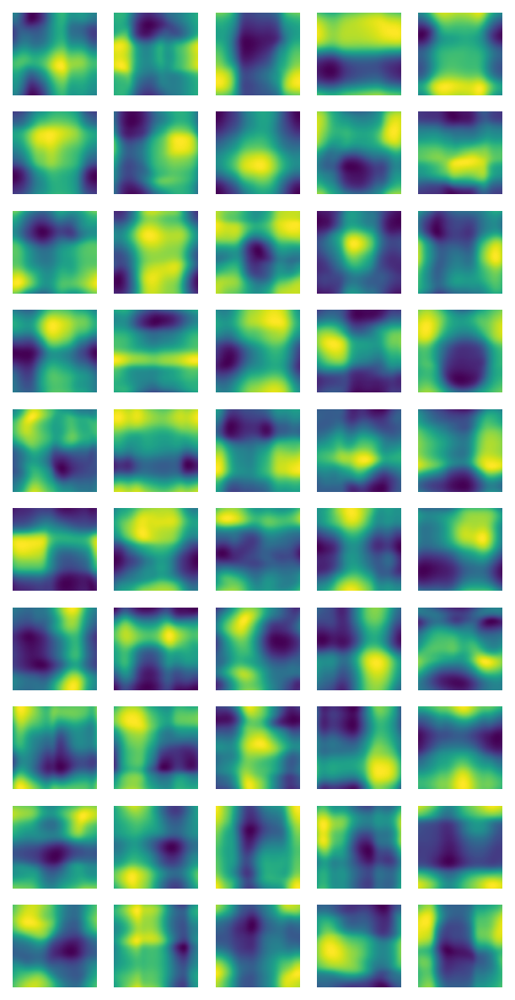

In [8]:
fig, axs = plt.subplots(nrows=10, ncols=N_test//10, figsize=(N_test//10,10), dpi=150)
for i in range(len(test_functions)):
    axs.flat[i].pcolormesh(XY[0], XY[1], test_functions[i](grid_data).reshape(N, N).cpu().detach())
    axs.flat[i].set_axis_off()

# Primal PINN

In [5]:
net_primal = PINN(n_periodic=25, n_hidden=50, n_layers=5, period_len=L)
total_params = sum(p.numel() for p in net_primal.parameters())
print(f"Number of parameters: {total_params}")
args = {'lr' : 1e-5, 'epochs' : 40000, 'dev' : dev, 'name' : f'NN_library/VPINN/square/VNPINN_primal_{total_params}_{N_test}'}

Number of parameters: 15601


In [6]:
net_primal = load_network(net_primal, args['name']+'_39999', args)
net_primal = net_primal.to(dev)

In [32]:
losses_train, losses_val = train_primal(net_primal, loaders, args, A_interp, H1, test_functions, G_inv, L)

Epoch: 0 mean train loss:  2.73805928e+00, mean val. loss:  7.76590645e-01
Epoch: 1 mean train loss:  2.72853303e+00, mean val. loss:  7.76317060e-01
Epoch: 2 mean train loss:  2.71907735e+00, mean val. loss:  7.76045144e-01
Epoch: 3 mean train loss:  2.70968056e+00, mean val. loss:  7.75774837e-01
Epoch: 4 mean train loss:  2.70036459e+00, mean val. loss:  7.75506079e-01
Epoch: 5 mean train loss:  2.69111633e+00, mean val. loss:  7.75238931e-01
Epoch: 6 mean train loss:  2.68193340e+00, mean val. loss:  7.74973214e-01
Epoch: 7 mean train loss:  2.67282176e+00, mean val. loss:  7.74709105e-01
Epoch: 8 mean train loss:  2.66378069e+00, mean val. loss:  7.74446547e-01
Epoch: 9 mean train loss:  2.65480542e+00, mean val. loss:  7.74185479e-01
Epoch: 10 mean train loss:  2.64589477e+00, mean val. loss:  7.73925900e-01
Epoch: 11 mean train loss:  2.63706231e+00, mean val. loss:  7.73667634e-01
Epoch: 12 mean train loss:  2.62829828e+00, mean val. loss:  7.73410976e-01
Epoch: 13 mean train l

In [33]:
np.save(f'NN_library/training_data/square/VNPINN_primal_{total_params}_{N_test}', np.vstack([losses_train, losses_val]))

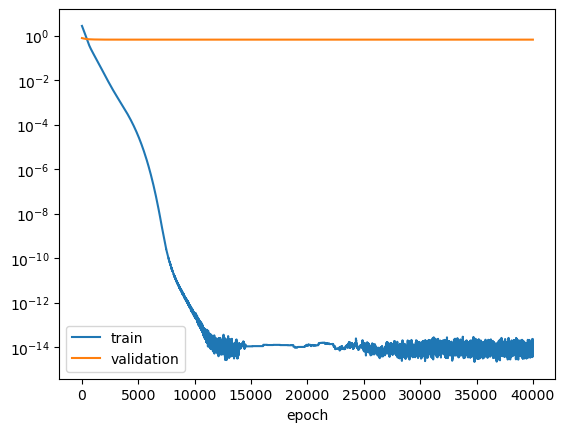

In [34]:
plt.plot(losses_train)
plt.plot(losses_val)
plt.xlabel('epoch')
plt.legend(['train', 'validation'])
plt.yscale('log')

In [36]:
U1 = net_primal(grid_data).detach().cpu()
error_1, _, _ = PDE_loss(grid_data, net_primal, A, H1)

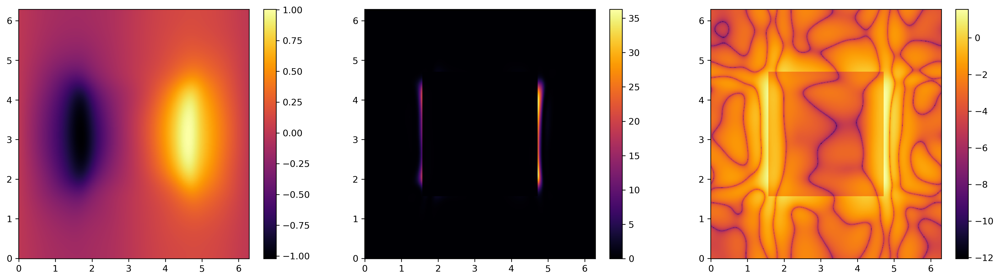

In [ ]:
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(19.5,5), dpi=300)
pos1 = axs[0].pcolormesh(XY[0], XY[1], U1.reshape(N, N), cmap='jet')
fig.colorbar(pos1, ax=axs[0])
pos2 = axs[1].pcolormesh(XY[0], XY[1], error_1.reshape(N, N).detach().cpu(), cmap='seismic')
fig.colorbar(pos2, ax=axs[1])
pos3 = axs[2].pcolormesh(XY[0], XY[1], np.log10(error_1.reshape(N, N).detach().cpu()), cmap='inferno')
fig.colorbar(pos3, ax=axs[2])

In [7]:
for i, x in enumerate(loaders['train']):
    areas, tri = get_areas(x)
    areas = areas.to(args['dev'])
x = x.to(args['dev'])
x_rot = torch.fliplr(x)

_, q1, gH = PDE_loss(x, net_primal, A_interp, H1)
bound_1 = compute_estimate(areas, tri, q1, gH, L).detach().item()
print(bound_1)

U1 = net_primal(x)
U2 = net_primal(x_rot)

bound_2 = compute_bound_primal(U1, U2, tri, x, A, L)[0,0]
print(bound_2)

np.save(f'bounds/square/A_u_VNPINN_{total_params}_{N_test}.npy', (bound_1, bound_2))

0.6505569219589233
0.6502077417275219


# Dual PINN

In [10]:
net_dual = PINN(n_periodic=25, n_hidden=50, n_layers=5, period_len=L)
total_params = sum(p.numel() for p in net_dual.parameters())
print(f"Number of parameters: {total_params}")
args = {'lr' : 0.00001, 'epochs' : 40000, 'dev' : dev, 'name' : f'NN_library/VPINN/square/VNPINN_dual_{total_params}_{N_test}'}

Number of parameters: 15601


In [11]:
net_dual = load_network(net_dual, args['name']+'_39999', args)
net_dual = net_dual.to(dev)

In [22]:
losses_train, losses_val = train_dual(net_dual, loaders, args, A_interp_inv, H1, test_functions, G_inv, L)

Epoch: 0 mean train loss:  2.81873901e+02, mean val. loss:  3.10813248e-01
Epoch: 1 mean train loss:  2.80964661e+02, mean val. loss:  3.11360776e-01
Epoch: 2 mean train loss:  2.80147003e+02, mean val. loss:  3.11908424e-01
Epoch: 3 mean train loss:  2.79107391e+02, mean val. loss:  3.12456101e-01
Epoch: 4 mean train loss:  2.78058594e+02, mean val. loss:  3.13003749e-01
Epoch: 5 mean train loss:  2.77247711e+02, mean val. loss:  3.13551337e-01
Epoch: 6 mean train loss:  2.76125824e+02, mean val. loss:  3.14098805e-01
Epoch: 7 mean train loss:  2.75374207e+02, mean val. loss:  3.14646095e-01
Epoch: 8 mean train loss:  2.74437378e+02, mean val. loss:  3.15193266e-01
Epoch: 9 mean train loss:  2.73373993e+02, mean val. loss:  3.15740198e-01
Epoch: 10 mean train loss:  2.72702515e+02, mean val. loss:  3.16286892e-01
Epoch: 11 mean train loss:  2.71720459e+02, mean val. loss:  3.16833317e-01
Epoch: 12 mean train loss:  2.70614990e+02, mean val. loss:  3.17379385e-01
Epoch: 13 mean train l

In [23]:
np.save(f'NN_library/training_data/square/VNPINN_dual_{total_params}_{N_test}', np.vstack([losses_train, losses_val]))

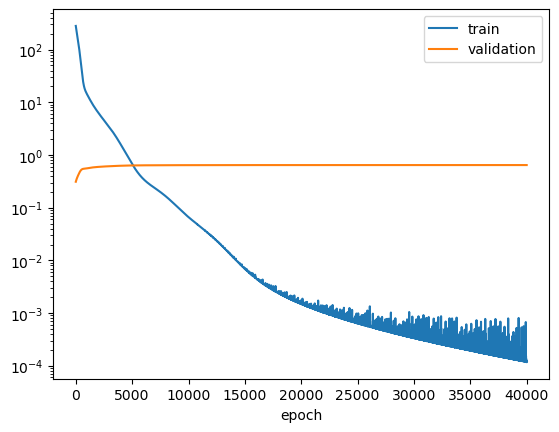

In [24]:
plt.plot(losses_train)
plt.plot(losses_val)
plt.xlabel('epoch')
plt.legend(['train', 'validation'])
plt.yscale('log')

In [10]:
U2 = net_dual(grid_data).detach().cpu()
error_2, _ = PDE_loss_dual(grid_data, net_dual, A_inv, H1)

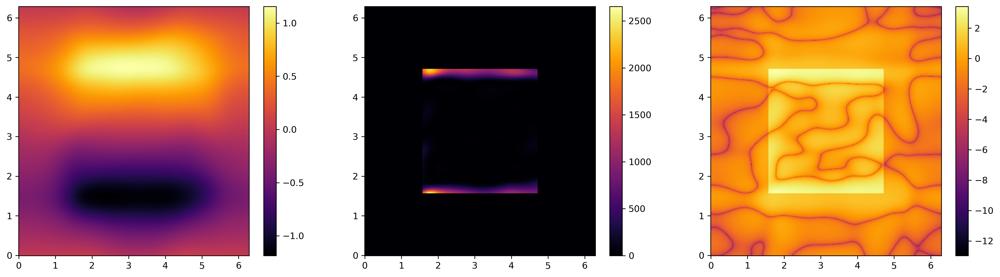

In [11]:
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(19.5,5), dpi=300)
pos1 = axs[0].pcolormesh(XY[0], XY[1], U2.reshape(N, N), cmap='inferno')
fig.colorbar(pos1, ax=axs[0])
pos2 = axs[1].pcolormesh(XY[0], XY[1], error_2.reshape(N, N).detach().cpu(), cmap='inferno')
fig.colorbar(pos2, ax=axs[1])
pos3 = axs[2].pcolormesh(XY[0], XY[1], np.log10(error_2.reshape(N, N).detach().cpu()), cmap='inferno')
fig.colorbar(pos3, ax=axs[2])

In [12]:
for i, x in enumerate(loaders['train']):
    areas, tri = get_areas(x)
    areas = areas.to(args['dev'])
x = x.to(args['dev'])
x_rot = torch.fliplr(x)
x_rot[:,1] = -x_rot[:,1]

_, q2, gH = PDE_loss_dual(x, net_dual, A_interp_inv, H1)
bound_1 = compute_estimate(areas, tri, q2, gH, L).detach().item()
print(1/bound_1)

W1 = net_dual(x)
W2 = net_dual(x_rot)

bound_2 = compute_bound_dual(W1, W2, tri, x, A_inv, L)[0,0]
print(bound_2)

np.save(f'bounds/square/A_l_VNPINN_{total_params}_{N_test}.npy', (1/bound_1, bound_2))

0.6342428352501256
0.626094050349762


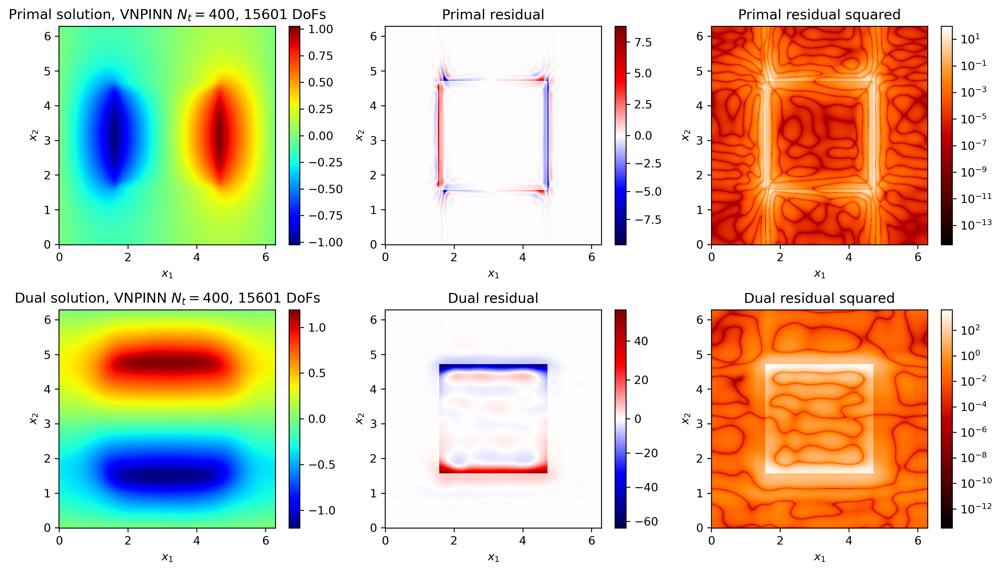

In [9]:
U1 = net_primal(grid_data).detach().cpu().reshape(N, N)
error_1_p, _, _ = PDE_loss(grid_data, net_primal, A, H1)
error_1_p = error_1_p.detach().cpu().reshape(N, N)
U2 = net_dual(grid_data).detach().cpu().reshape(N, N)
error_1_d, _, _ = PDE_loss_dual(grid_data, net_dual, A_inv, H1)
error_1_d = error_1_d.detach().cpu().reshape(N, N)

from matplotlib.colors import TwoSlopeNorm, LogNorm

fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(12,7), dpi=300)

for i in range(6):
    axs.flat[i].set_xlabel('$x_1$')
    axs.flat[i].set_ylabel('$x_2$')

pos1 = axs[0,0].pcolormesh(XY[0], XY[1], U1, cmap='jet')
fig.colorbar(pos1, ax=axs[0,0])
pos2 = axs[1,0].pcolormesh(XY[0], XY[1], U2, cmap='jet')
fig.colorbar(pos2, ax=axs[1,0])

axs[0,0].set_title(f'Primal solution, VNPINN $N_t=400$, {total_params} DoFs')
axs[1,0].set_title(f'Dual solution, VNPINN $N_t=400$, {total_params} DoFs')


pos1 = axs[0,1].pcolormesh(XY[0], XY[1], error_1_p, cmap='seismic', norm=TwoSlopeNorm(vmin=error_1_p.min(), vcenter=0, vmax=error_1_p.max()))
fig.colorbar(pos1, ax=axs[0,1])
pos2 = axs[1,1].pcolormesh(XY[0], XY[1], error_1_d, cmap='seismic', norm=TwoSlopeNorm(vmin=error_1_d.min(), vcenter=0, vmax=error_1_d.max()))
fig.colorbar(pos2, ax=axs[1,1])

axs[0,1].set_title('Primal residual')
axs[1,1].set_title('Dual residual')

pos1 = axs[0,2].pcolormesh(XY[0], XY[1], error_1_p**2, cmap='gist_heat', norm=LogNorm(vmin=(error_1_p**2).min(), vmax=(error_1_p**2).max()))
fig.colorbar(pos1, ax=axs[0,2])
pos2 = axs[1,2].pcolormesh(XY[0], XY[1], error_1_d**2, cmap='gist_heat', norm=LogNorm(vmin=(error_1_d**2).min(), vmax=(error_1_d**2).max()))
fig.colorbar(pos2, ax=axs[1,2])

axs[0,2].set_title('Primal residual squared')
axs[1,2].set_title('Dual residual squared')
plt.tight_layout()